<a href="https://colab.research.google.com/github/Northwind01/metaphors/blob/master/1_Getting_data_%26_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/googlecolab/colabtools/blob/master/notebooks/colab-github-demo.ipynb)

# Getting data and performing EDA

## 0. Set-up

### Get the spaCy model

In [0]:
# Get the spaCy model for embeddings
!python -m spacy download en_core_web_lg

     |████████████████████████████████| 826.9MB 64.2MB/s 
  Created wheel for en-core-web-lg: filename=en_core_web_lg-2.1.0-cp36-none-any.whl size=828255076 sha256=fbf3dbefe356530e521af89834a50467574ffe72082b62165de224bb97058cab
  Stored in directory: /tmp/pip-ephem-wheel-cache-19c80xl5/wheels/b4/d7/70/426d313a459f82ed5e06cc36a50e2bb2f0ec5cb31d8e0bdf09
Successfully built en-core-web-lg
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_lg')


When done, restart the runtime

### Imports

In [0]:
import sys, os, time
import shutil, requests, operator
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy import stats
sns.set(color_codes=True)
import spacy
from collections import Counter
from gensim.corpora import WikiCorpus
from wordcloud import WordCloud
import _pickle as cPickle
from sklearn import cluster, metrics
from sklearn.decomposition import PCA #Principal Component Analysis
from sklearn.manifold import TSNE #T-Distributed Stochastic Neighbor Embedding
import random

#plotly imports
import plotly as py
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

### Load the spaCy model

In [0]:
# Load the en_core_web_lg embeddings 
nlp = spacy.load('en_core_web_lg')

### Get Google drive access

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')
root_path = 'gdrive/My Drive/metaphors/'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


### Set the paths

In [0]:
corpus_dir = root_path + 'data/Wikipedia/'
corpus_text_file = os.path.join(corpus_dir, 'wiki_en.txt')
pickle_dir = root_path + 'data/pickles/'
preprocessing_dir = pickle_dir + 'pre_processing/'
EDA_dir = pickle_dir + 'EDA/'
data_cache = root_path + 'data/cache/'

## 1. Get the corpus

### First import

#### Getting a new input Wikipedia file

In [0]:
if not os.path.isfile(corpus_text_file):
  if not os.path.exists(corpus_dir):
    os.makedirs(corpus_dir)

    #corpus_text = 'enwiki-latest-pages-articles.xml.bz2'
    corpus_text = 'enwiki-latest-pages-articles1.xml-p10p30302.bz2'
    download_url = 'https://dumps.wikimedia.org/enwiki/latest/' + corpus_text
    
    if not os.path.exists(data_cache):
        os.makedirs(data_cache)
    
    filepath = os.path.join(data_cache, corpus_text)

    if not os.path.isfile(filepath):
        response = requests.get(download_url, stream=True)
        with open(filepath, 'wb') as out_file:
            shutil.copyfileobj(response.raw, out_file)

print("Corpus available locally")

Corpus available locally


In [0]:
corpus_text = 'enwiki-latest-pages-articles1.xml-p10p30302.bz2'
filepath = os.path.join(data_cache, corpus_text)

#### Pre-processing the text file

In [0]:
def tokenize(content, token_min_len=1, token_max_len=15, lower=True):
  '''Override for the original method in WikiCorpus to account for punctuation'''
  return [token for token in content.split() 
           if ((len(token) <= token_max_len) and (not token.startswith('_')))]

In [0]:
if os.path.isfile(filepath):
  with open(corpus_text_file, 'w') as file:
    wiki = WikiCorpus(filepath, tokenizer_func=tokenize)   
    i = 0

    for text in wiki.get_texts():
      file.write(bytes(' '.join(text), 'utf-8').decode('utf-8') + '\n')
      i = i + 1

      if (i % 1000 == 0):
        print('Processed ' + str(i) + ' articles')
                
  print('Processing complete!')
    
# Get rid of the file source (the required text file itself will remain)
#os.unlink(filepath)

Processed 1000 articles
Processed 2000 articles
Processed 3000 articles
Processed 4000 articles
Processed 5000 articles
Processed 6000 articles
Processed 7000 articles
Processed 8000 articles
Processed 9000 articles
Processed 10000 articles
Processed 11000 articles
Processed 12000 articles
Processed 13000 articles
Processed 14000 articles
Processing complete!


### Basic pre-processing

In [0]:
# Just checking
corpus_file = open(corpus_text_file,'r')
corpus_file.readline()

'\'\'\'Anarchism\'\'\' is an political and social philosophy that rejects hierarchies deemed unjust and advocates their replacement with self-managed, self-governed societies based on voluntary, cooperative institutions. These institutions are often described as stateless societies, although several authors have defined them more specifically as distinct institutions based on or free associations. Anarchism\'s central disagreement with other ideologies is that it holds the state to be undesirable, unnecessary, and harmful. Anarchism is usually placed on the far-left of the political spectrum, and much of its economics and legal philosophy reflect interpretations of communism, collectivism, syndicalism, mutualism, or participatory economics. As anarchism does not offer a fixed body of doctrine from a single particular worldview, many anarchist types and traditions exist and varieties of anarchy diverge widely. Anarchist schools of thought can differ fundamentally, supporting anything fr

In [0]:
def load_corpus(input_file):

    '''Loads corpus from text file into memory'''
    
    print('Loading corpus...')
    time1 = time.time()
    corpus = input_file.read()
    time2 = time.time()
    total_time = time2-time1
    print('It took %0.3f seconds to load corpus' %total_time)
    return corpus

In [0]:
corpus = load_corpus(corpus_file)

Loading corpus...
It took 3.404 seconds to load corpus


In [0]:
type(corpus)

str

In [0]:
# Get articles
articles = corpus.split('\n')
len(articles)

14909

In [0]:
# Average article length in symbols
sum(map(len, articles))/len(articles)

21977.937420350125

### spaCy processing

In [0]:
# Convert articles to SpaCy docs and save intermediate results
if not os.path.exists(preprocessing_dir):
  os.makedirs(preprocessing_dir)

docs = []
i = 0

for article in articles:
  doc = nlp(article)
  docs.append(doc)
    
  i = i + 1
  if (i % 1000 == 0):
    print('Processed ' + str(i) + ' articles')
    
    nlp_pickle_file = os.path.join(preprocessing_dir, 'nlp_articles' + str(i) + '.pickle')
    with open(nlp_pickle_file, "wb") as output_file:
      cPickle.dump(docs, output_file)
    docs = []

nlp_pickle_file = os.path.join(preprocessing_dir, 'nlp_articles' + str(i) + '.pickle')
with open(nlp_pickle_file, "wb") as output_file:
  cPickle.dump(docs, output_file)

print('Processing complete!')

Processed 1000 articles
Processed 2000 articles
Processed 3000 articles
Processed 4000 articles
Processed 5000 articles
Processed 6000 articles
Processed 7000 articles
Processed 8000 articles
Processed 9000 articles
Processed 10000 articles
Processed 11000 articles
Processed 12000 articles
Processed 13000 articles
Processed 14000 articles
Processing complete!


## 2. EDA

### Extract info from the processed data

In [0]:
# Initialize the variables
length_in_tokens = []
length_in_sents = []
vocab = {}
entities = {}
POS = {}
dependencies = {}
embeddings = []

In [0]:
# Define extraction functions: doc=>get_info(doc)
def get_sents(doc):
  return len(list(doc.sents))

def get_vocab(doc):
  words = [token.text for token in doc if token.is_stop != True and token.is_punct != True]
  return Counter(words)

ent_types = ['PERSON', 'NORP', 'FAC', 'ORG', 'GPE', 'LOC', 'PRODUCT', 'EVENT', 'WORK_OF_ART', 'LAW', 'LANGUAGE']
def get_ents(doc):
  ents = [str(ent) for ent in doc.ents if ent.label_ in ent_types]
  return Counter(ents)

def get_pos(doc):
  pos = [token.pos_ for token in doc]
  return Counter(pos)

def get_deps(doc):
  deps = [token.dep_ for token in doc]
  return Counter(deps)

def get_vecs(doc):
  return doc.vector

In [0]:
# Loop through the files an extract info
for filename in os.listdir(preprocessing_dir):
  if filename.endswith(".pickle"):
    path = os.path.join(preprocessing_dir, filename)
    with open(path, "rb") as input_file:
      docs = pd.Series(cPickle.load(input_file))
      length_in_tokens.extend(docs.apply(len))
      length_in_sents.extend(docs.apply(get_sents))
      embeddings.extend(docs.apply(get_vecs))
      
      for dic in docs.apply(get_vocab):
        vocab.update(dic)
      for dic in docs.apply(get_ents):
        entities.update(dic)
      for dic in docs.apply(get_pos):
        POS.update(dic)
      for dic in docs.apply(get_deps):
        dependencies.update(dic)
    
    print('Processed '+ filename)

print('Number of aticles: ' + str(len(length_in_tokens)))
print('Number of words: ' + str(len(vocab)))
print('Number of entities: ' + str(len(entities)))
print('Number of parts-of-speech: ' + str(len(POS)))
print('Number of dependencies: ' + str(len(dependencies)))

print('Processing complete!')

Processed nlp_articles1000.pickle
Processed nlp_articles2000.pickle
Processed nlp_articles3000.pickle
Processed nlp_articles4000.pickle
Processed nlp_articles5000.pickle
Processed nlp_articles6000.pickle
Processed nlp_articles7000.pickle
Processed nlp_articles8000.pickle
Processed nlp_articles9000.pickle
Processed nlp_articles10000.pickle
Processed nlp_articles11000.pickle
Processed nlp_articles12000.pickle
Processed nlp_articles13000.pickle
Processed nlp_articles14000.pickle
Processed nlp_articles14909.pickle
Number of aticles: 14909
Number of words: 902741
Number of entities: 1161397
Number of parts-of-speech: 16
Number of dependencies: 46
Processing complete!


In [0]:
# Pickle all the infos
pickles = dict(zip(['length_in_tokens', 'length_in_sents', 'embeddings', 'vocab', 'entities', 'POS', 'dependencies'], 
                   [length_in_tokens, length_in_sents, embeddings, vocab, entities, POS, dependencies]))

for k,v in pickles.items():
  pickle_file = os.path.join(EDA_dir, k + '.pickle')
  with open(pickle_file, "wb") as output_file:
    cPickle.dump(v, output_file)

### Lengths

In [0]:
# Number or articles
len(length_in_tokens)

14909

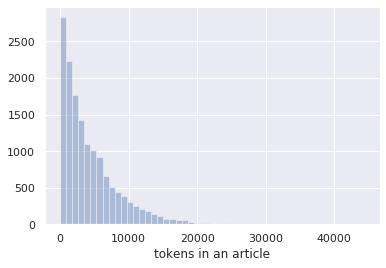

In [0]:
# Distribution of number of tokens in an article
sns.distplot(length_in_tokens, kde=False, axlabel='tokens in an article');

In [0]:
length_in_tokens = pd.Series(length_in_tokens)
print('Average length in tokens = ' + str(length_in_tokens.mean()))

Average length in tokens = 4339.548527734925


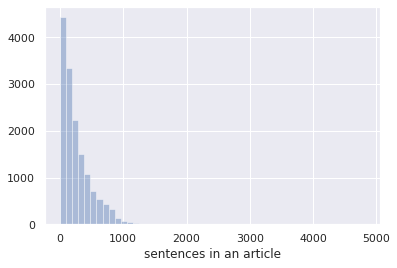

In [0]:
# Distribution of number of sentences in an article
sns.distplot(length_in_sents, kde=False, axlabel='sentences in an article');

In [0]:
length_in_sents = pd.Series(length_in_sents)
print('Average length in sentences = ' + str(length_in_sents.mean()))

Average length in sentences = 257.0605674424844


### Helper functions 

In [0]:
# Visualize most frequent
def vis_dict(dictionary):
  wordcloud = WordCloud(background_color='white', width=600, height=400)
  wordcloud.generate_from_frequencies(frequencies=dictionary)

  plt.figure(figsize=(20,10))
  plt.imshow(wordcloud, interpolation="bilinear")
  plt.axis("off")
  plt.show()

In [0]:
# Show top X
def show_top(dictionary, top_print, top_dist, x_label):
  top_list = sorted(dictionary.items(),key=operator.itemgetter(1),reverse=True)

  print('TOP ' + str(top_print) + ':')
  print(' ')
  for word in top_list[:top_print]:
      print(word[0], word[1])

  print(' ')
  print('Top ' + str(top_dist) + ':')
  sns.distplot(np.arange(1, top_dist + 1, 1),
              bins=top_dist,  
              hist_kws={"weights":[v for k,v in top_list][:top_dist]}, 
              kde=False, 
              axlabel='top ' + x_label);

In [0]:
# Up-pickle and visualize a dictionary
def unpickle_dict(pickle_name, top_print, top_dist, x_label):
  pickle_file = os.path.join(EDA_dir, pickle_name + '.pickle')
  with open(pickle_file, "rb") as input_file:
    dictionary = cPickle.load(input_file)

  print('Number of items: ' + str(len(dictionary)))
  vis_dict(dictionary)
  show_top(dictionary, top_print, top_dist, x_label)

### Vocabulary

Number of items: 902741


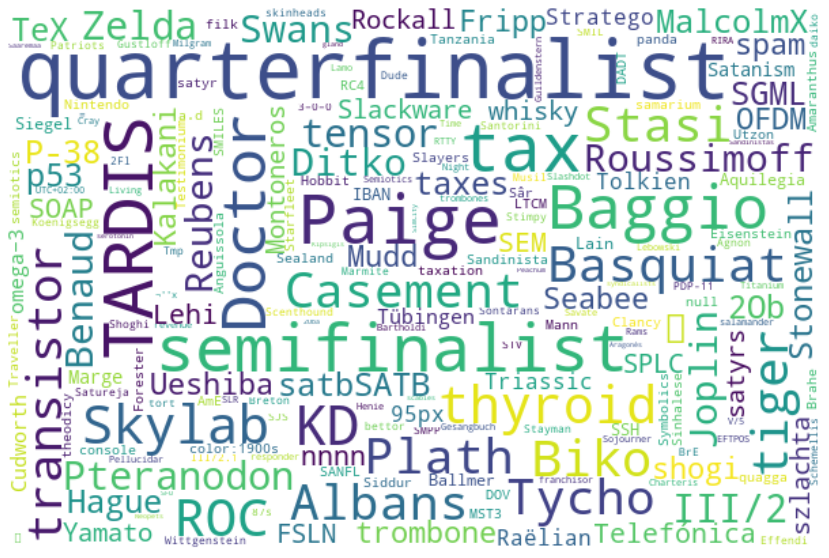

TOP 10:
 
quarterfinalist 541
TARDIS 375
tax 374
Paige 372
semifinalist 356
Doctor 292
Baggio 290
KD 226
Skylab 214
ROC 208
 
Top 100:


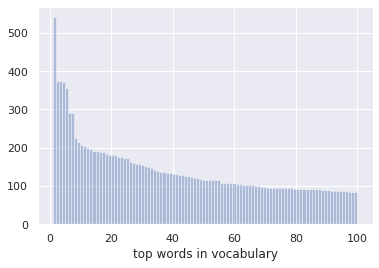

In [0]:
unpickle_dict('vocab', 10, 100, 'words in vocabulary')

### Entities

https://spacy.io/api/annotation#named-entities

Number of items: 1161397


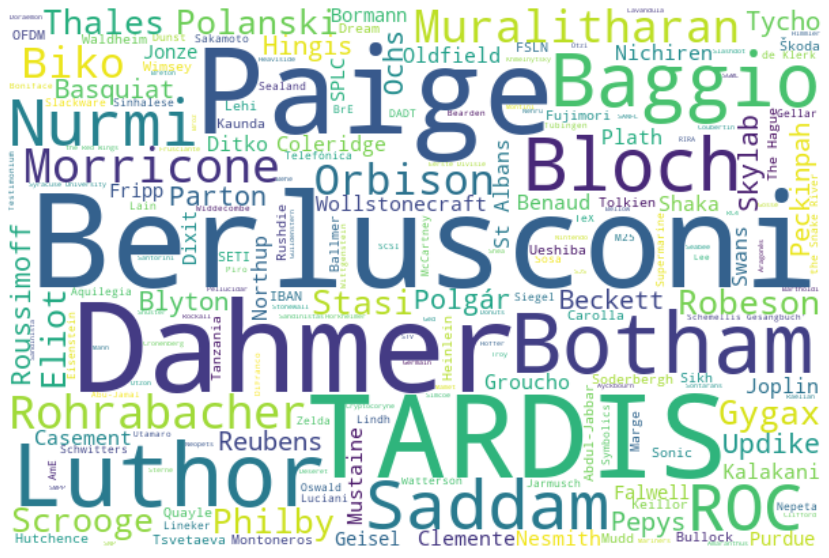

TOP 10:
 
Berlusconi 421
Dahmer 388
Paige 353
TARDIS 340
Luthor 307
Botham 278
Baggio 272
Bloch 259
Saddam 225
Nurmi 202
 
Top 100:


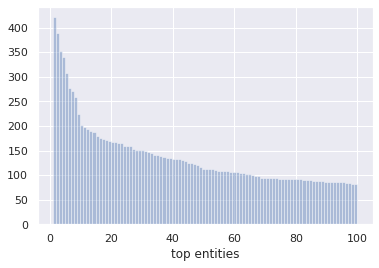

In [0]:
unpickle_dict('entities', 10, 100, 'entities')

### Part-of-speech

https://stackoverflow.com/questions/40288323/what-do-spacys-part-of-speech-and-dependency-tags-mean

Number of items: 16


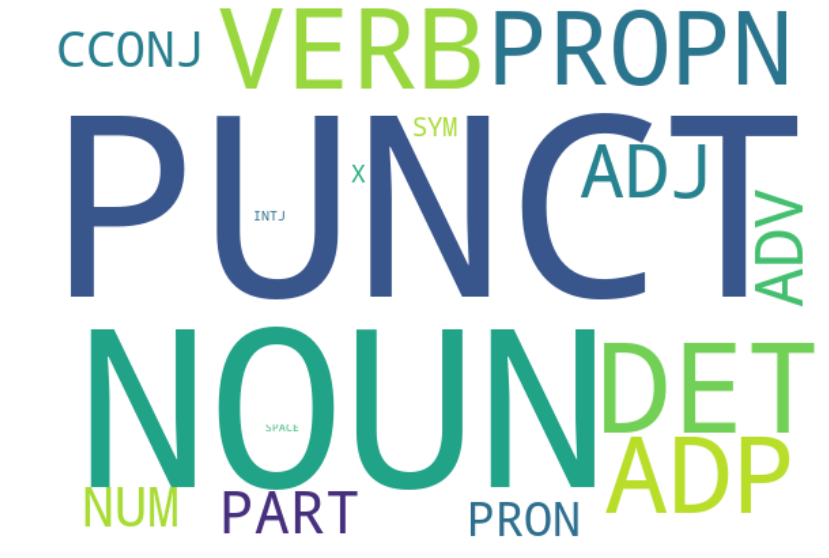

TOP 10:
 
PUNCT 3602
NOUN 2719
DET 2472
VERB 2287
ADP 2096
PROPN 1872
ADJ 889
ADV 685
PART 504
NUM 445
 
Top 15:


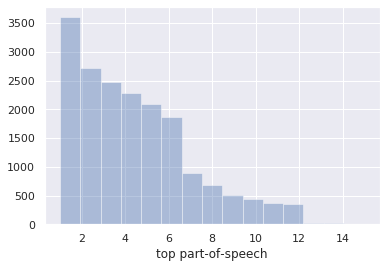

In [0]:
unpickle_dict('POS', 10, 15, 'part-of-speech')

### Dependencies

Number of items: 46


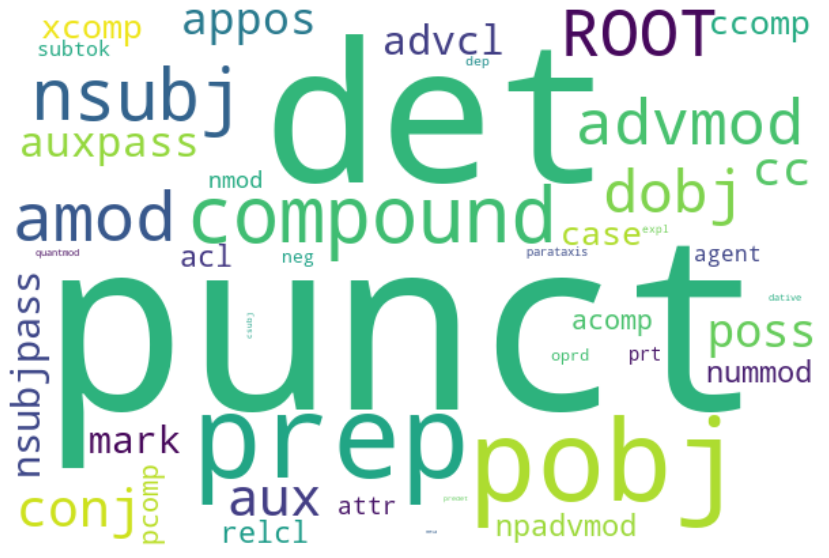

TOP 10:
 
punct 3575
det 2183
prep 1749
pobj 1672
compound 960
nsubj 808
amod 752
ROOT 693
advmod 630
dobj 555
 
Top 46:


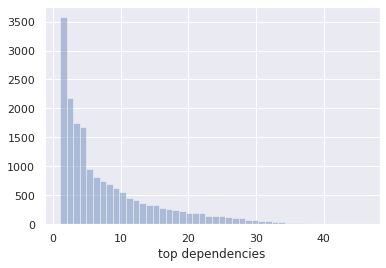

In [0]:
unpickle_dict('dependencies', 10, 46, 'dependencies')

### Embeddings

In [0]:
# Un-pickle embeddings
pickle_file = os.path.join(EDA_dir, 'embeddings.pickle')
with open(pickle_file, "rb") as input_file:
  docv = pd.Series(cPickle.load(input_file)).apply(pd.Series)

In [0]:
len(docv)

14909

In [0]:
print(type(docv))
print(type(docv[0]))
print(type(docv[0][0]))
print(docv.shape)

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>
<class 'numpy.float32'>
(14909, 300)


## Clustering the articles

https://www.kaggle.com/minc33/visualizing-high-dimensional-clusters

In [0]:
# Initialize and fit the model
n_clusters = 5
kmeans = cluster.KMeans(n_clusters=n_clusters)
kmeans.fit(docv)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [0]:
# Find which cluster each data-point belongs to
clusters = kmeans.predict(docv)

In [0]:
docv['cluster'] = clusters

### Visualising

##### Method #1: Principal Component Analysis (PCA)

In [0]:
# plotX is a DataFrame containing 5000 values sampled randomly from docv
plotX = pd.DataFrame(np.array(docv.sample(5000)))

# Rename plotX's columns since it was briefly converted to an np.array above
plotX.columns = docv.columns

In [0]:
# PCA with two principal components
pca = PCA(n_components=3)
Components = pd.DataFrame(pca.fit_transform(plotX.drop(["cluster"], axis=1)))
Components.columns = ["Comp1", "Comp2", "Comp3"] # change for 2d

In [0]:
py.__version__

'4.1.1'

In [0]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [0]:
def get_colors(n):
  ret = []
  r = int(random.random() * 256)
  g = int(random.random() * 256)
  b = int(random.random() * 256)
  step = 256 / n
  for i in range(n):
    r += step
    g += step
    b += step
    r = int(r) % 256
    g = int(g) % 256
    b = int(b) % 256
    o = float(0.8)
    ret.append((r,g,b,o)) 
  return ret

In [0]:
# Building the plot
configure_plotly_browser_state()
init_notebook_mode(connected=False)

data = []
colors = get_colors(n_clusters)
Components['cluster'] = plotX['cluster']

for i in range(n_clusters):
  color = 'rgba' + str(colors[i])
  trace = go.Scatter3d( # change for 2d
                      x = Components[Components["cluster"] == i]["Comp1"],
                      y = Components[Components["cluster"] == i]["Comp2"],
                      z = Components[Components["cluster"] == i]["Comp3"], # change for 2d
                      mode = "markers",
                      name = "Cluster " + str(i),
                      marker = dict(color = color),
                      text = None)
  data.append(trace)

title = "Visualizing clusters in two dimensions using PCA"

layout = dict(title=title,
              xaxis=dict(title='Comp1',ticklen= 5,zeroline=False),
              yaxis=dict(title='Comp2',ticklen= 5,zeroline=False)
             )

fig = dict(data=data, layout=layout)

iplot(fig)

##### Method #2: T-Distributed Stochastic Neighbor Embedding (T-SNE)

In [0]:
# plotX is a DataFrame containing 5000 values sampled randomly from docv
plotX = pd.DataFrame(np.array(docv.sample(5000)))

# Rename plotX's columns since it was briefly converted to an np.array above
plotX.columns = docv.columns

In [0]:
# Set the perplexity and initialize the T-SNE model:
perplexity = 50
tsne = TSNE(n_components=3, perplexity=perplexity)

In [0]:
# This DataFrame contains three dimensions, built by T-SNE
Components = pd.DataFrame(tsne.fit_transform(plotX.drop(["cluster"], axis=1)))

In [0]:
Components.columns = ["Comp1","Comp2","Comp3"]

In [0]:
# Building the plot
configure_plotly_browser_state()
init_notebook_mode(connected=False)

data = []
colors = get_colors(n_clusters)
Components['cluster'] = plotX['cluster']

for i in range(n_clusters):
  color = 'rgba' + str(colors[i])
  trace = go.Scatter3d( # change for 2d
                      x = Components[Components["cluster"] == i]["Comp1"],
                      y = Components[Components["cluster"] == i]["Comp2"],
                      z = Components[Components["cluster"] == i]["Comp3"], # change for 2d
                      mode = "markers",
                      name = "Cluster " + str(i),
                      marker = dict(color = color),
                      text = None)
  data.append(trace)

title = "Visualizing clusters in two dimensions using T-SNE"

layout = dict(title=title,
              xaxis=dict(title='Comp1',ticklen= 5,zeroline=False),
              yaxis=dict(title='Comp2',ticklen= 5,zeroline=False)
             )

fig = dict(data=data, layout=layout)

iplot(fig)